<a href="https://colab.research.google.com/github/minioncutie/2005/blob/main/detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# ===============================
# STEP 1: Install & Import
# ===============================
!git clone https://github.com/KSHITIJBITHEL/Automated-Cough-Detection.git
%cd Automated-Cough-Detection

!pip install librosa matplotlib numpy

import librosa, librosa.display
import IPython.display as ipd
import matplotlib.pyplot as plt
import numpy as np
import os


Cloning into 'Automated-Cough-Detection'...
remote: Enumerating objects: 786, done.
remote: Counting objects: 100% (13/13), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 786 (delta 7), reused 2 (delta 2), pack-reused 773 (from 1)
Receiving objects: 100% (786/786), 468.18 MiB | 33.40 MiB/s, done.
Resolving deltas: 100% (10/10), done.
Updating files: 100% (755/755), done.
/content/Automated-Cough-Detection


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

MessageError: Error: credential propagation was unsuccessful

In [ ]:
import librosa, librosa.display
import matplotlib.pyplot as plt
import numpy as np

sample_file = "cough20.wav"   # change if needed
amp_data, samp_freq = librosa.load(sample_file, sr=None)

print("✅ Loaded:", sample_file)
print("Sample rate:", samp_freq)
print("Duration (s):", len(amp_data)/samp_freq)



✅ Loaded: cough20.wav
Sample rate: 22050
Duration (s): 8.0


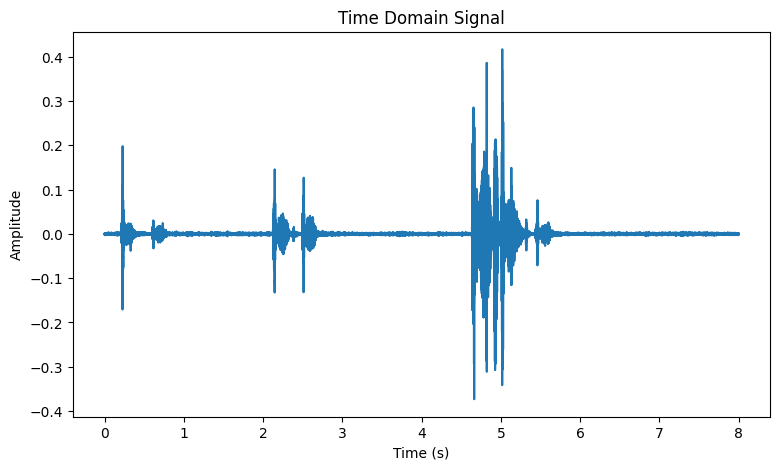

In [ ]:
time = np.linspace(0, len(amp_data)/samp_freq, len(amp_data))

plt.figure(figsize=(9, 5))
plt.plot(time, amp_data)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Time Domain Signal')
plt.show()



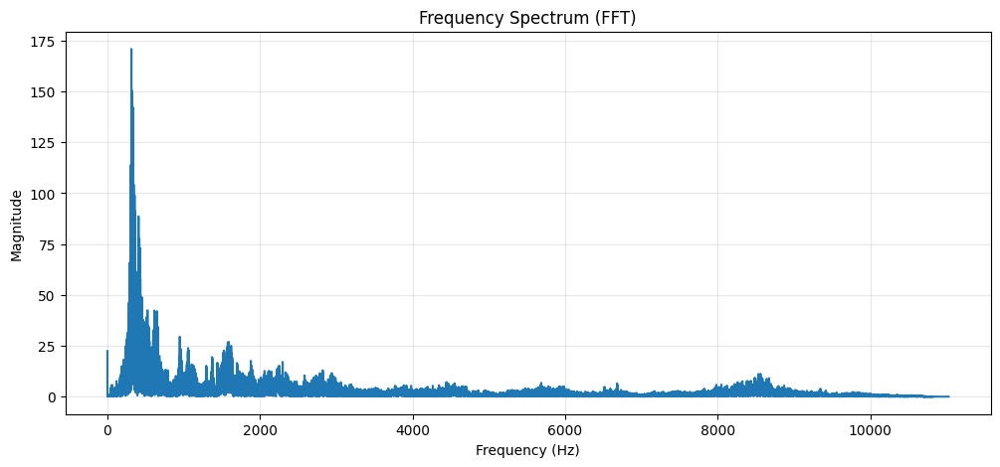

In [ ]:
# Apply FFT
X = np.fft.fft(amp_data)              # Fourier Transform
X_mag = np.abs(X)                     # Magnitude spectrum
f = np.linspace(0, samp_freq, len(X)) # Frequency axis

# Plot only up to Nyquist frequency (half the sampling rate)
f_bins = len(X) // 2

plt.figure(figsize=(12, 5))
plt.plot(f[:f_bins], X_mag[:f_bins])
plt.xlabel("Frequency (Hz)")
plt.ylabel("Magnitude")
plt.title("Frequency Spectrum (FFT)")
plt.grid(True, alpha=0.3)
plt.show()


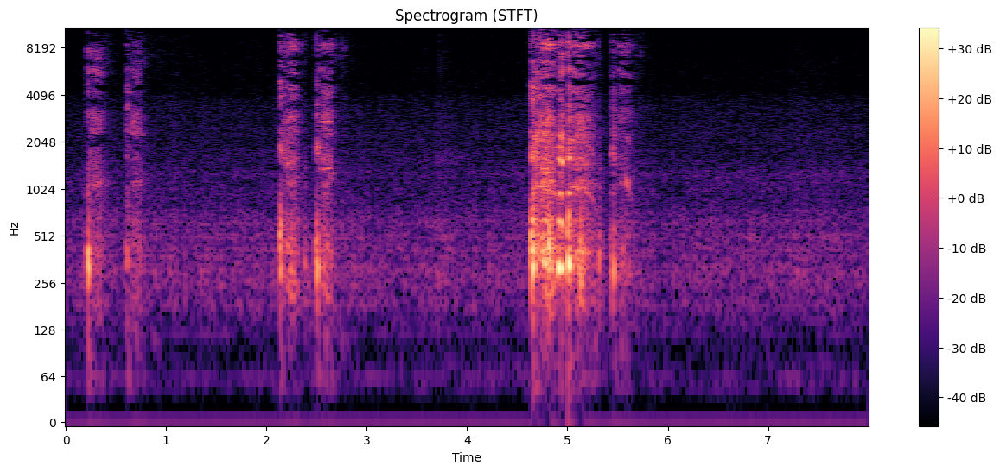

In [ ]:
import librosa.display

# Parameters
FRAME_SIZE = 2048
HOP_SIZE = 512

# Short-Time Fourier Transform (STFT)
stft = librosa.stft(amp_data, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

# Convert to dB (log scale for better visualization)
y = librosa.power_to_db(np.abs(stft)**2)

# Plot Spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(y, sr=samp_freq, hop_length=HOP_SIZE,
                         x_axis="time", y_axis="log")
plt.colorbar(format="%+2.f dB")
plt.title("Spectrogram (STFT)")
plt.show()


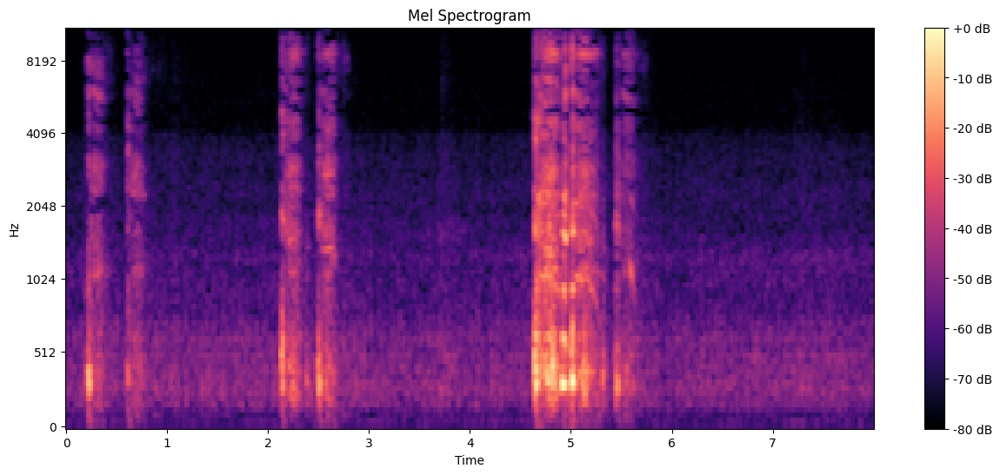

In [ ]:
import librosa, librosa.display

# Create Mel filter banks (not always needed for plotting but good for checking)
filter_banks = librosa.filters.mel(n_fft=2048, sr=samp_freq, n_mels=90)

# Mel spectrogram
mel_spectrogram = librosa.feature.melspectrogram(
    y=amp_data,
    sr=samp_freq,
    n_fft=2048,
    hop_length=512,
    n_mels=90  # you can set 10, 40, 64, 90 etc. depending on resolution
)

# Convert to log scale (dB)
log_mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)

# Plot
plt.figure(figsize=(15, 6))
librosa.display.specshow(log_mel_spectrogram, sr=samp_freq,
                         hop_length=512, x_axis="time", y_axis="mel")
plt.colorbar(format="%+2.f dB")
plt.title("Mel Spectrogram")
plt.show()


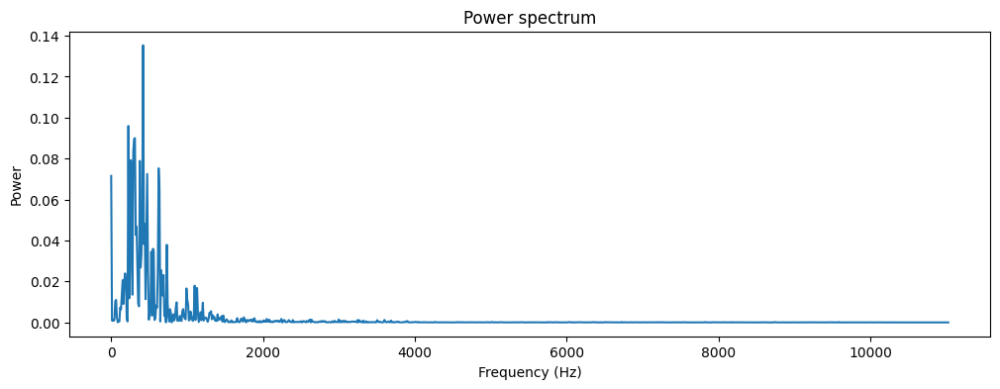

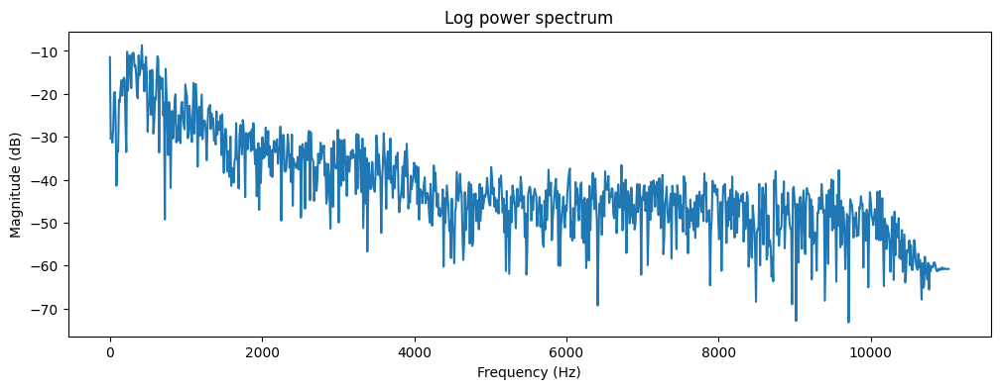

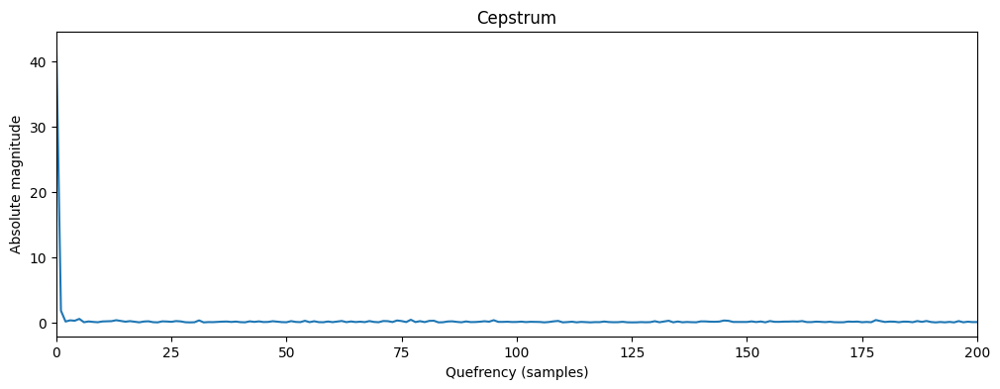

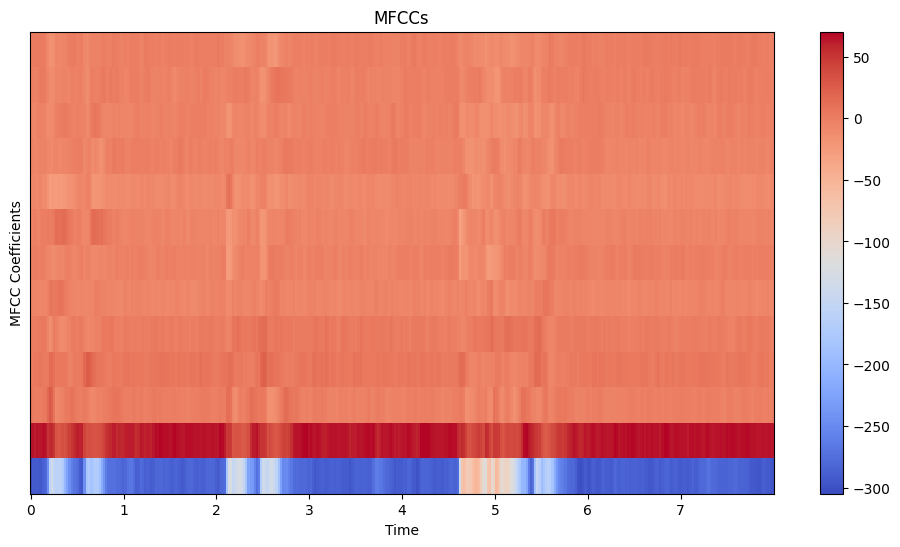

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

# Load your signal (replace amp_data with your array if already loaded)
y = amp_data
sr = samp_freq

# ----------------------------
# 1. Power Spectrum
# ----------------------------
N = 2048
fft = np.fft.fft(y, n=N)
power_spectrum = np.abs(fft[:N//2]) ** 2

plt.figure(figsize=(12,4))
plt.plot(np.linspace(0, sr/2, len(power_spectrum)), power_spectrum)
plt.title("Power spectrum")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Power")
plt.show()

# ----------------------------
# 2. Log Power Spectrum
# ----------------------------
log_power_spectrum = 10 * np.log10(power_spectrum + 1e-10)

plt.figure(figsize=(12,4))
plt.plot(np.linspace(0, sr/2, len(log_power_spectrum)), log_power_spectrum)
plt.title("Log power spectrum")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Magnitude (dB)")
plt.show()

# ----------------------------
# 3. Cepstrum (via IDFT of log power spectrum)
# ----------------------------
cepstrum = np.fft.ifft(log_power_spectrum).real

plt.figure(figsize=(12,4))
plt.plot(np.arange(len(cepstrum)), np.abs(cepstrum))
plt.title("Cepstrum")
plt.xlabel("Quefrency (samples)")
plt.ylabel("Absolute magnitude")
plt.xlim(0, 200)   # zoom into first 200 samples
plt.show()

# ----------------------------
# 4. MFCCs using librosa (shortcut way)
# ----------------------------
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13, n_fft=2048, hop_length=512, n_mels=40)

plt.figure(figsize=(12,6))
librosa.display.specshow(mfccs, x_axis='time', sr=sr)
plt.colorbar()
plt.title("MFCCs")
plt.ylabel("MFCC Coefficients")
plt.show()


In [ ]:
import os
import numpy as np
import librosa
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, InputLayer, Flatten, Reshape, BatchNormalization, Conv2D, MaxPooling2D, AveragePooling2D
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.constraints import MaxNorm
from tensorflow.keras.callbacks import TensorBoard
import time
import datetime


In [ ]:
import os

print(os.getcwd())  # Current working directory
print(os.listdir())  # Files/folders in current dir

if os.path.exists("cough_audio"):
    print("cough_audio folder contents:", os.listdir("cough_audio")[:10])  # show first 10 files
else:
    print("No folder named cough_audio found.")


/content/Automated-Cough-Detection
['cough20.wav', 'src', '.git', 'README.md', 'dataset', 'LICENSE']
No folder named cough_audio found.


In [89]:
import os
import numpy as np
import librosa

print("Loading Dataset")

frame_size = 2048
n_mfcc = 13

# First file
audio_file = "dataset/cough_audio/cough372.wav"   # use any existing file
signal, sr = librosa.load(audio_file)
mfcc_feat = librosa.feature.mfcc(y=signal, sr=sr, n_mfcc=n_mfcc,
                                 n_fft=frame_size,
                                 hop_length=int((len(signal)-frame_size)/100))

X = np.array([])
X = np.append([], mfcc_feat)

# Second file
audio_file = "dataset/cough_audio/cough378.wav"   # another existing file
signal, sr = librosa.load(audio_file)
mfcc_feat = librosa.feature.mfcc(y=signal, sr=sr, n_mfcc=n_mfcc,
                                 n_fft=frame_size,
                                 hop_length=int((len(signal)-frame_size)/100))

C = np.array([])
C = np.append([], mfcc_feat)
X = np.append([X], [C], axis=0)

# Loop through all remaining files
for fname in os.listdir("dataset/cough_audio"):
    audio_file = os.path.join("dataset/cough_audio", fname)
    if os.path.isfile(audio_file) and fname.endswith(".wav"):
        signal, sr = librosa.load(audio_file)
        mfcc_feat = librosa.feature.mfcc(y=signal, sr=sr, n_mfcc=n_mfcc,
                                         n_fft=frame_size,
                                         hop_length=int((len(signal)-frame_size)/100))
        C = np.array([])
        C = np.append([], mfcc_feat)
        X = np.append(X, [C], axis=0)
        print(X.shape)


Loading Dataset
(3, 1326)
(4, 1326)
(5, 1326)
(6, 1326)
(7, 1326)
(8, 1326)
(9, 1326)
(10, 1326)
(11, 1326)
(12, 1326)
(13, 1326)
(14, 1326)
(15, 1326)
(16, 1326)
(17, 1326)
(18, 1326)
(19, 1326)
(20, 1326)
(21, 1326)
(22, 1326)
(23, 1326)
(24, 1326)
(25, 1326)
(26, 1326)
(27, 1326)
(28, 1326)
(29, 1326)
(30, 1326)
(31, 1326)
(32, 1326)
(33, 1326)
(34, 1326)
(35, 1326)
(36, 1326)
(37, 1326)
(38, 1326)
(39, 1326)
(40, 1326)
(41, 1326)
(42, 1326)
(43, 1326)
(44, 1326)
(45, 1326)
(46, 1326)
(47, 1326)
(48, 1326)
(49, 1326)
(50, 1326)
(51, 1326)
(52, 1326)
(53, 1326)
(54, 1326)
(55, 1326)
(56, 1326)
(57, 1326)
(58, 1326)
(59, 1326)
(60, 1326)
(61, 1326)
(62, 1326)
(63, 1326)
(64, 1326)
(65, 1326)
(66, 1326)
(67, 1326)
(68, 1326)
(69, 1326)
(70, 1326)
(71, 1326)
(72, 1326)
(73, 1326)
(74, 1326)
(75, 1326)
(76, 1326)
(77, 1326)
(78, 1326)
(79, 1326)
(80, 1326)
(81, 1326)
(82, 1326)
(83, 1326)
(84, 1326)
(85, 1326)
(86, 1326)
(87, 1326)
(88, 1326)
(89, 1326)
(90, 1326)
(91, 1326)
(92, 1326)
(

In [90]:
Y = np.ones((X.shape[0], 1))
Y.shape

(354, 1)

In [92]:
import os
import numpy as np
import librosa

print("Loading Dataset...")

frame_size = 2048
n_mfcc = 13

def extract_features(folder, label):
    """Extract MFCC features from all wav files in a folder and assign label"""
    features = []
    labels = []
    for fname in os.listdir(folder):
        audio_file = os.path.join(folder, fname)
        if os.path.isfile(audio_file) and fname.endswith(".wav"):
            signal, sr = librosa.load(audio_file)
            mfcc_feat = librosa.feature.mfcc(
                y=signal, sr=sr, n_mfcc=n_mfcc,
                n_fft=frame_size,
                hop_length=int((len(signal)-frame_size)/100)
            )
            features.append(mfcc_feat.flatten())
            labels.append(label)
    return features, labels

# Load cough = 1
cough_X, cough_Y = extract_features("dataset/cough_audio", 1)

# Load noise = 0
noise_X, noise_Y = extract_features("dataset/noise_audio", 0)

# Combine
X = np.array(cough_X + noise_X)
Y = np.array(cough_Y + noise_Y).reshape(-1, 1)

print("✅ Dataset Loaded")
print("X.shape =", X.shape)   # (num_samples, num_features)
print("Y.shape =", Y.shape)   # (num_samples, 1)
print("Class balance:", np.unique(Y, return_counts=True))


Loading Dataset...
✅ Dataset Loaded
X.shape = (751, 1326)
Y.shape = (751, 1)
Class balance: (array([0, 1]), array([399, 352]))


In [100]:
# In this block we are further appending the audio samples of noise and adding their labels

for i in range(424):
    audio_file = "dataset/noise_audio/noise" + str(i) + ".wav"   # ✅ correct path
    if os.path.isfile(audio_file):
        signal, sr = librosa.load(audio_file)
        frame_size = 2048
        mfcc = librosa.feature.mfcc(
            y=signal, sr=sr, n_mfcc=n_mfcc,
            n_fft=frame_size,
            hop_length=int((len(signal)-frame_size)/100)
        )
        C = np.array([])
        C = np.append([], mfcc)          # keep same as cough block
        X = np.append(X, [C], axis=0)    # append features
        Y = np.append(Y, [[0]], axis=0)  # label = 0 for noise
        print(X.shape, Y.shape)



(752, 1326) (752, 1)
(753, 1326) (753, 1)
(754, 1326) (754, 1)
(755, 1326) (755, 1)
(756, 1326) (756, 1)
(757, 1326) (757, 1)
(758, 1326) (758, 1)
(759, 1326) (759, 1)
(760, 1326) (760, 1)
(761, 1326) (761, 1)
(762, 1326) (762, 1)
(763, 1326) (763, 1)
(764, 1326) (764, 1)
(765, 1326) (765, 1)
(766, 1326) (766, 1)
(767, 1326) (767, 1)
(768, 1326) (768, 1)
(769, 1326) (769, 1)
(770, 1326) (770, 1)
(771, 1326) (771, 1)
(772, 1326) (772, 1)
(773, 1326) (773, 1)
(774, 1326) (774, 1)
(775, 1326) (775, 1)
(776, 1326) (776, 1)
(777, 1326) (777, 1)
(778, 1326) (778, 1)
(779, 1326) (779, 1)
(780, 1326) (780, 1)
(781, 1326) (781, 1)
(782, 1326) (782, 1)
(783, 1326) (783, 1)
(784, 1326) (784, 1)
(785, 1326) (785, 1)
(786, 1326) (786, 1)
(787, 1326) (787, 1)
(788, 1326) (788, 1)
(789, 1326) (789, 1)
(790, 1326) (790, 1)
(791, 1326) (791, 1)
(792, 1326) (792, 1)
(793, 1326) (793, 1)
(794, 1326) (794, 1)
(795, 1326) (795, 1)
(796, 1326) (796, 1)
(797, 1326) (797, 1)
(798, 1326) (798, 1)
(799, 1326) (

In [101]:
from sklearn.model_selection import train_test_split

In [102]:

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.33, random_state=42, shuffle = True)
classes = 1

In [103]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, InputLayer, Flatten, Reshape, BatchNormalization, Conv2D, MaxPooling2D, AveragePooling2D
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.constraints import MaxNorm
from tensorflow.keras.callbacks import TensorBoard
import time
import datetime

In [105]:
# Logging for TensorBoard
log_dir = "logs/fit/single1"
tensorboard = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

# Model architecture
model = Sequential()
model.add(InputLayer(shape=(X_train.shape[1], 1), name='x_input'))
model.add(Reshape((int(X_train.shape[1] / n_mfcc), n_mfcc, 1)))

model.add(Conv2D(10, kernel_size=5, activation="relu", padding='same', kernel_constraint=MaxNorm(3)))
model.add(AveragePooling2D(pool_size=2, padding='same'))

model.add(Conv2D(5, kernel_size=5, activation="relu", padding='same', kernel_constraint=MaxNorm(3)))
model.add(AveragePooling2D(pool_size=2, padding='same'))

model.add(Flatten())

# ⚠️ If you are doing binary classification (cough vs noise), classes=1 here
model.add(Dense(1, activation='sigmoid', name='y_pred', kernel_constraint=MaxNorm(3)))

# Optimizer with learning rate
opt = Adam(learning_rate=0.003)

# Compile
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])

# Train
model.fit(X_train, Y_train, epochs=8, validation_data=(X_test, Y_test), callbacks=[tensorboard])

print("end of a session")


Epoch 1/8
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.6695 - loss: 3.2056 - val_accuracy: 0.8684 - val_loss: 0.5384
Epoch 2/8
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9495 - loss: 0.1999 - val_accuracy: 0.9395 - val_loss: 0.1568
Epoch 3/8
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - accuracy: 0.9498 - loss: 0.1781 - val_accuracy: 0.9474 - val_loss: 0.1152
Epoch 4/8
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.9755 - loss: 0.0891 - val_accuracy: 0.9737 - val_loss: 0.0842
Epoch 5/8
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - accuracy: 0.9840 - loss: 0.0588 - val_accuracy: 0.9658 - val_loss: 0.0930
Epoch 6/8
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - accuracy: 0.9875 - loss: 0.0461 - val_accuracy: 0.9553 - val_loss: 0.0974
Epoch 7/8
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9735 - loss: 0.0658 - val_accuracy: 0.9500 - val_loss: 0.0999
Epoch 8/8
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - accuracy: 0.9810 - loss: 0.0499 - val_accuracy: 0.9711 - val_loss

In [106]:
%reload_ext tensorboard
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

In [107]:
Y_pred = model.predict(X_test)
Y_pred = Y_pred.round()

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


In [108]:
#checking confusion matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score, precision_score, accuracy_score

confusion_matrix(Y_test, Y_pred)

array([[251,   8],
       [  3, 118]])

In [109]:
print(f1_score(Y_test, Y_pred), precision_score(Y_test, Y_pred), accuracy_score(Y_test, Y_pred))

0.9554655870445344 0.9365079365079365 0.9710526315789474


In [125]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ reshape_1 (Reshape)             │ (None, 102, 13, 1)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 102, 13, 10)    │           260 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_4             │ (None, 51, 7, 10)      │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 51, 7, 5)       │         1,255 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_5             │ (None, 26, 4, 5)       │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 520)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ y_pred (Dense)                  │ (None, 1)              │           521 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,110 (23.87 KB)

 Trainable params: 2,036 (7.95 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,074 (15.92 KB)

In [111]:
from sklearn.neural_network import MLPClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
clf = MLPClassifier(random_state=1, max_iter=300).fit(X_train, Y_train)
clf.score(X_test, Y_test)

/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1124: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.9394736842105263

In [113]:
y, fs = librosa.load("dataset/noise_audio/noise2.wav")
ipd.Audio("dataset/noise_audio/noise2.wav")

In [115]:
mfcc = librosa.feature.mfcc(
    y=signal, sr=sr, n_mfcc=n_mfcc,
    n_fft=frame_size,
    hop_length=int((len(signal) - frame_size) / 100)
)


In [116]:
vector = np.array([np.append([],[mfcc])])

In [117]:
vector.shape

(1, 1326)

In [118]:
op = model.predict(vector)



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


In [119]:
print(op.round(), op)

[[0.]] [[2.361562e-08]]
